#DelayCat Delay Line Variation Experimental Results

In this notebook, audio from DelayCat with default settings and various target radii, ranging from 0.0 to 1.0, are compared to a control delay signal from a standard commercial delay plugin. Comparison will done via computing the per sample difference in waveform as well as the difference in feature analysis between the different signals.

With target radius of 0, we expect to find 0 variation from the control signal. Then as the target radius increases, we expect to find corrolated increase in waveform and feature analysis difference metrics.

#Installs
Only necessary for some environments, such as binder.

In [ ]:
# uncomment if necessary or set up your environment accordingly
#%pip install matplotlib
#%pip install scipy
#%pip install sklearn
#%pip install scikit-learn
#%pip install librosa

#Imports

In [ ]:
%matplotlib inline
from pathlib import Path
import numpy, scipy, matplotlib.pyplot as plt, sklearn, urllib, IPython.display as ipd
import librosa, librosa.display
import urllib.request
from scipy.io.wavfile import write

#Load Files and Format Trial Data

Currently, these files are hosted through a mounted drive, so they probably won't work for other people. This will be changed.

In [ ]:
sr = 44100

dry_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/Dry 2.wav'
dry, dry_sr = librosa.load(dry_fn, sr=sr)

control_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/Control.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
control, control_sr = librosa.load(control_fn, sr=sr)

dcdefault_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat 00.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcdefault, dcdefault_sr = librosa.load(dcdefault_fn, sr=sr)

dcvariation1_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat Variation 05.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcvariation1, dcvariation1_sr = librosa.load(dcvariation1_fn, sr=sr)

dcvariation2_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat Variation 10.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcvariation2, dcvariation1_sr = librosa.load(dcvariation2_fn, sr=sr)

dcvariation3_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat Variation 15.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcvariation3, dcvariation1_sr = librosa.load(dcvariation3_fn, sr=sr)

dcvariation4_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat Variation 25.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcvariation4, dcvariation1_sr = librosa.load(dcvariation4_fn, sr=sr)

dcvariation5_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat Variation 50.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcvariation5, dcvariation1_sr = librosa.load(dcvariation5_fn, sr=sr)

dcvariation6_fn = '/content/drive/MyDrive/Delay Cat Drive/Experiments/Delay Line Proof and Variation/Audio/DelayCat Variation 100.wav' #urllib.request.urlretrieve('https://drive.google.com/uc?export=download&id=1cxadavzlRG9yyKyrTC_ku4SoRv61kiUX')[0]
dcvariation6, dcvariation1_sr = librosa.load(dcvariation6_fn, sr=sr)

# 7 trias
trials = [{"target_radius" : 0.00, "audio" : dcdefault, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diffs" : None},
          {"target_radius" : 0.05, "audio" : dcvariation1, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.10, "audio" : dcvariation2, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.15, "audio" : dcvariation3, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.25, "audio" : dcvariation4, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 0.50, "audio" : dcvariation5, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None},
          {"target_radius" : 1.00, "audio" : dcvariation6, "diff" : None, "total_diff" : 0.0, "features" : None, "feature_total_diff" : None}]

def extract_features(audio):
  features = {'flatness' : numpy.array([librosa.feature.spectral_flatness(y=audio[i: i + 1024])[0, 0] for i in range(0, len(audio), 1024)]),
              'rms' : numpy.array([librosa.feature.rms(y=audio[i: i + 1024])[0, 0] for i in range(0, len(audio), 1024)]),
              'centroid' : numpy.array([librosa.feature.spectral_centroid(y=audio[i: i + 1024])[0, 0] for i in range(0, len(audio), 1024)])}
  return features

control_features = extract_features(control)

def conduct_trial(trial):
  print("trial:", trial, '| target radius = ', trials[trial]['target_radius'])
  print("Delayed Signal:")
  display(ipd.Audio(trials[trial]['audio'], rate=sr))

  bias = 1
  trials[trial]['diff'] = numpy.asarray([control[i + bias] - trials[trial]['audio'][i] for i in range(len(control) - bias)])

  print("Diff:")
  if (trial == 0):
    # must use this method to avoid automatic normalization of audio output
    scaled = numpy.int16(trials[trial]['diff'] * 32767)
    fname = str(trial) + '_diff.wav'
    write(fname, sr, scaled)
    display(ipd.Audio(fname, rate=sr))
  else:
    # want normalization for other trials because they may have difference samples > 1
    display(ipd.Audio(trials[trial]['diff'], rate=sr))

  plt.figure(figsize=(12, 4))
  librosa.display.waveshow(trials[trial]['diff'], sr=sr)
  plt.ylim([-2.0, 2.0]) # use 2.0 because diff samples more be as large as 2
  plt.title('waveform diff')

  trials[trial]['total_diff'] = numpy.sum(numpy.abs(trials[trial]['diff']))
  #print(trials[trial]['total_diff'])

  trials[trial]['features'] = extract_features(trials[trial]['audio'])
  trials[trial]['feature_diffs'] = {'flatness' : numpy.subtract(trials[trial]['features']['flatness'], control_features['flatness']),
                                          'rms' : numpy.subtract(trials[trial]['features']['rms'], control_features['rms']),
                                          'centroid' : numpy.subtract(trials[trial]['features']['centroid'], control_features['centroid'])}
  trials[trial]['feature_total_diffs'] = {'flatness' : numpy.sum(numpy.abs(trials[trial]['feature_diffs']['flatness'])),
                                          'rms' : numpy.sum(numpy.abs(trials[trial]['feature_diffs']['rms'])),
                                          'centroid' : numpy.sum(numpy.abs(trials[trial]['feature_diffs']['centroid']))}

  # scaling issues with plot
  #t = librosa.frames_to_time(range(len(trials[trial]['feature_diffs']['flatness']))) * 4 # something about my frame size causes this * 4 to be needed
  #plt.plot(t, trials[trial]['feature_diffs']['flatness'], color='r')
  #plt.plot(t, trials[trial]['feature_diffs']['rms'], color='g')
  #plt.plot(t, trials[trial]['feature_diffs']['centroid'], color='b')

  plt.show()

  print('Feature Total Diffs:')
  print('waveform:', trials[trial]['total_diff'])
  print('flatness:', trials[trial]['feature_total_diffs']['flatness'])
  print('rms:', trials[trial]['feature_total_diffs']['rms'])
  print('centroid:', trials[trial]['feature_total_diffs']['centroid'])

  # scaling issues and not particularly meaningful because you want to compare this data to other trials, not look at it alone
  #data = trials[trial]['feature_total_diffs']
  #plt.bar(data.keys(), data.values())
  #for index, value in enumerate(data.values()):
  #  plt.text(index - 0.1, value + 0.02, '{0:.4f}'.format(value))
  #plt.ylabel('feature total diff')
  #plt.title('feature total diffs')
  #plt.show()  

  #t = librosa.frames_to_time(range(len(trials[trial]['features']['rms']))) * 4 # something about my frame size causes this *4 to be needed
  #plt.plot(t, trials[trial]['features']['rms'], color='r')

#assert(len(control) == len(dcdefault) == len(dcvariation))

/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=1024
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/librosa/core/spectrum.py:256: UserWarning: n_fft=2048 is too large for input signal of length=30
  warnings.warn(


##Dry Audio

Original, undelayed signal input into delay plugins.

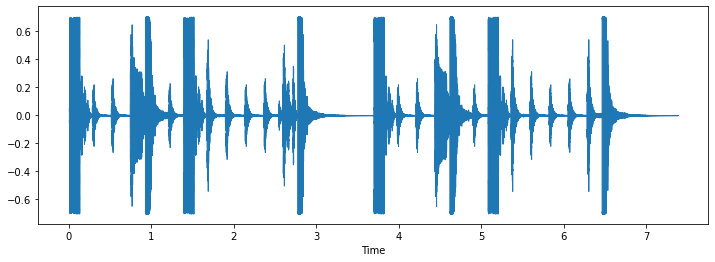

In [ ]:
display(ipd.Audio(dry, rate=sr))

plt.figure(figsize=(12, 4))
librosa.display.waveshow(dry, sr=sr)

##Control Audio

Delayed signal from an standard delay plugin.

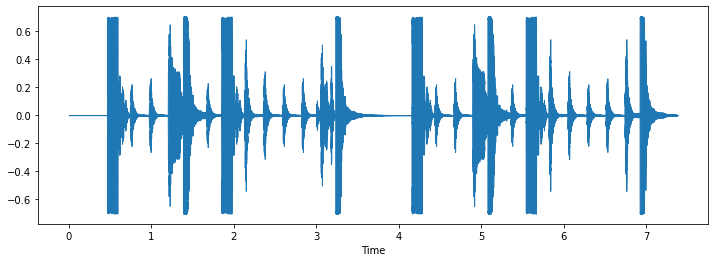

In [ ]:
display(ipd.Audio(control, rate=sr))

plt.figure(figsize=(12, 4))
librosa.display.waveshow(control, sr=sr)

#Delay Line Proof

Here, we test the ability of the architecture to behave exactly like a normal delay by comparing the resulting delayed signal of DelayCat with default parameters and target radius of 0 to the control delay signal.

##Delay Cat Default Audio

DelayCat delayed signal with parameters such that it will behave exactly like a normal delay line (TargetRadius = 0, Shifting = true).

trial: 0 | target radius =  0.0
Delayed Signal:


Diff:


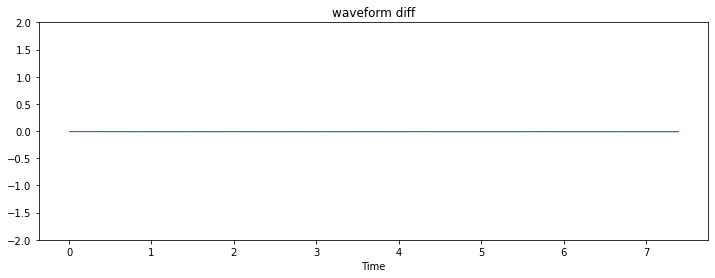

Feature Total Diffs:
waveform: 0.001327559
flatness: 2.6012788
rms: 0.0152054
centroid: 10578.314311025028


In [ ]:
conduct_trial(0)

As we can see, there is no difference between our trial with target radius = 0 and the control signal.

This shows DelayCat's ability to perform exactly like the normal delay line (though there is actually some very minimal difference, out of the range of hearing).

#Variation Experiment

With an expanded target radius, we can see how natural sounding variation is introduced by selecting qualitatively similar but different segments.

We expect to see the amount of difference between the delayed signal and the control to grow as the target radius increases.

##DelayCat Variation / Control Difference

Run all trials, with increasing target radius, starting at 0.

trial: 0 | target radius =  0.0
Delayed Signal:


Diff:


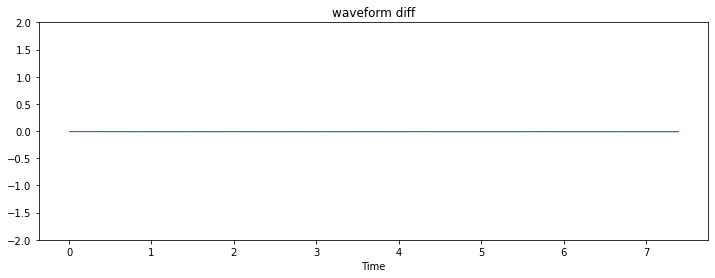

Feature Total Diffs:
waveform: 0.001327559
flatness: 2.6012788
rms: 0.0152054
centroid: 10578.314311025028


In [ ]:
conduct_trial(0)

trial: 1 | target radius =  0.05
Delayed Signal:


Diff:


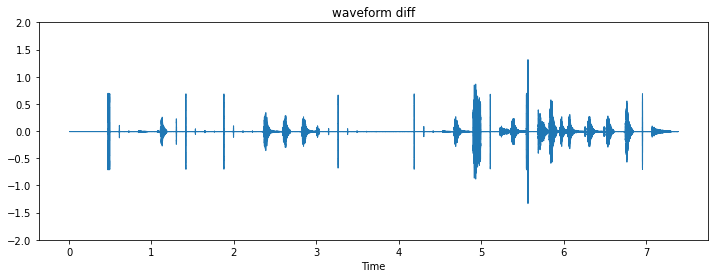

Feature Total Diffs:
waveform: 5197.024
flatness: 5.7995577
rms: 2.4017253
centroid: 46812.709109001444


In [ ]:
conduct_trial(1)

trial: 2 | target radius =  0.1
Delayed Signal:


Diff:


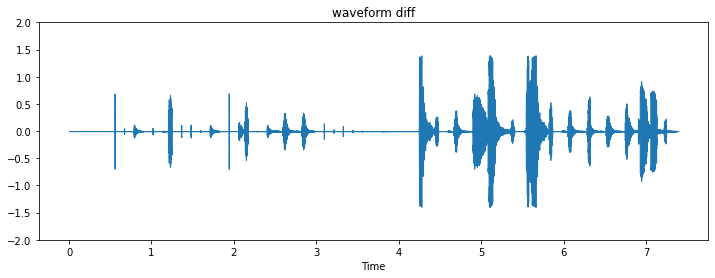

Feature Total Diffs:
waveform: 14371.006
flatness: 4.232742
rms: 4.215055
centroid: 61224.64777238402


In [ ]:
conduct_trial(2)

trial: 3 | target radius =  0.15
Delayed Signal:


Diff:


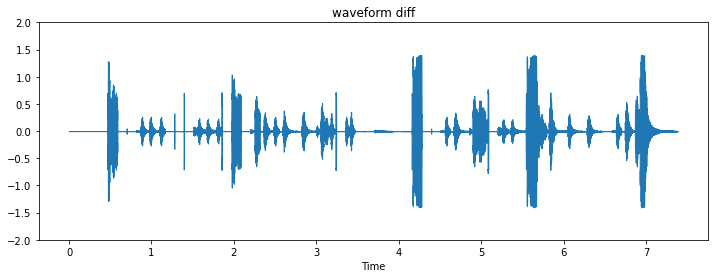

Feature Total Diffs:
waveform: 22059.299
flatness: 6.1835575
rms: 7.5232005
centroid: 90670.24538320223


In [ ]:
conduct_trial(3)

trial: 4 | target radius =  0.25
Delayed Signal:


Diff:


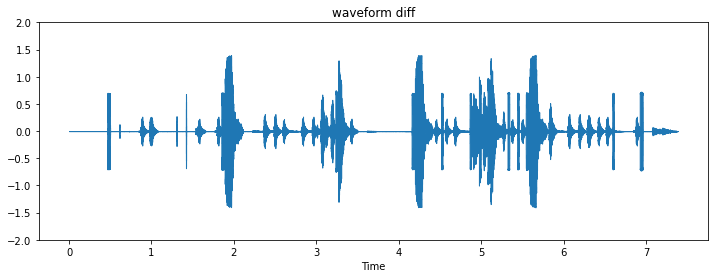

Feature Total Diffs:
waveform: 26139.92
flatness: 8.413475
rms: 9.243326
centroid: 138180.09937525884


In [ ]:
conduct_trial(4)

trial: 5 | target radius =  0.5
Delayed Signal:


Diff:


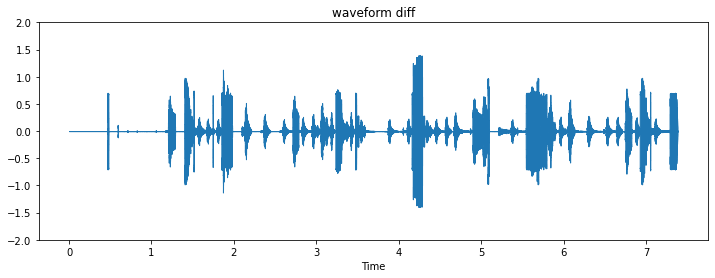

Feature Total Diffs:
waveform: 25666.395
flatness: 8.475538
rms: 14.749047
centroid: 166868.9280456751


In [ ]:
conduct_trial(5)

trial: 6 | target radius =  1.0
Delayed Signal:


Diff:


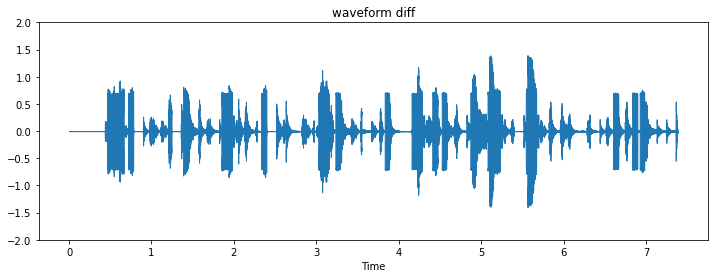

Feature Total Diffs:
waveform: 37611.895
flatness: 14.14983
rms: 25.66038
centroid: 306279.23066805064


In [ ]:
conduct_trial(6)

The amount of difference does, in fact, grow in correlation with the target radius.

Also notice how, the amount of difference is typically higher in the second half of the waveform. This is because that is after the loop repeats and the delay line is now populated with very similar segments from the last repeat of the loop (as well as simply being more populated with audio to potentially select). This pattern is noticeable in all of the trials except for the last trial, in which it is fully random with target radius of 1.

# Total Diffs vs. Target Radius Plotted

Below we have graphs plotting the total waveform and feature diffs, as computed in the trials above, plotted, where the x axis is the target radius used for that trial.

Measurements are taken closer together in the lower range of target radii because small differences in target radius are more influential in that range.

The correlation between target radius and diff is also computed and displayed.

We expect to see strong correlation as the target radius increases.

Audio waveform diff:
Correlation = 0.9642857142857145


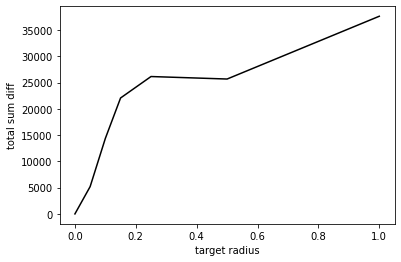

In [ ]:
# waveform diff
print('Audio waveform diff:')
data = ([trial['target_radius'] for trial in trials], [trial['total_diff'] for trial in trials])
plt.plot(data[0], data[1], color='black')
plt.ylabel('total sum diff')
plt.xlabel('target radius')

waveform_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(waveform_correlation))
plt.show()

Flatness diff:
Correlation = 0.9642857142857145


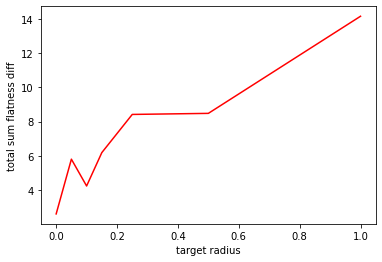

In [ ]:
# flatness diff
print('Flatness diff:')
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['flatness'] for trial in trials])
plt.plot(data[0], data[1], 'r')
plt.ylabel('total sum flatness diff')
plt.xlabel('target radius')

flatness_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(flatness_correlation))
plt.show()

RMS diff:
Correlation = 1.0


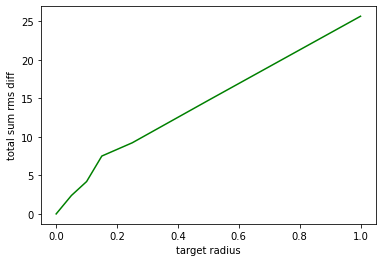

In [ ]:
# rms diff
print('RMS diff:')
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['rms'] for trial in trials])
plt.plot(data[0], data[1], 'g')
plt.ylabel('total sum rms diff')
plt.xlabel('target radius')

rms_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(rms_correlation))
plt.show()

Centroid diff:
Correlation = 1.0


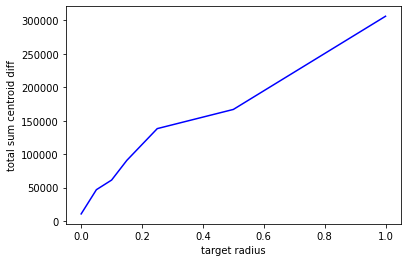

In [ ]:
# centroid diff
print('Centroid diff:')
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['centroid'] for trial in trials])
plt.plot(data[0], data[1], 'b')
plt.ylabel('total sum centroid diff')
plt.xlabel('target radius')

centroid_correlation, p = scipy.stats.spearmanr(data[0], data[1])
print('Correlation = ' + str(centroid_correlation))
plt.show()

All diffs:


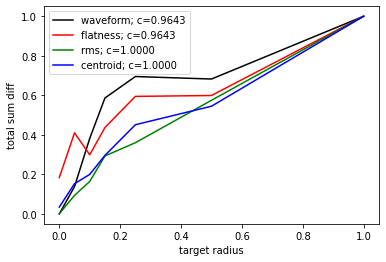

In [ ]:
# all together
print('All diffs:')
data = ([trial['target_radius'] for trial in trials], [trial['total_diff'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'black', label=('waveform; c=' + '{0:.4f}'.format(waveform_correlation)))
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['flatness'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'r', label=('flatness; c=' + '{0:.4f}'.format(flatness_correlation)))
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['rms'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'g', label=('rms; c=' + '{0:.4f}'.format(rms_correlation)))
data = ([trial['target_radius'] for trial in trials], [trial['feature_total_diffs']['centroid'] for trial in trials])
plt.plot(data[0], numpy.divide(numpy.asarray(data[1]), numpy.max(numpy.asarray(data[1]))), 'b', label=('centroid; c=' + '{0:.4f}'.format(centroid_correlation)))
plt.ylabel('total sum diff')
plt.xlabel('target radius')
plt.legend()
plt.show()

We do see a strong correlation between target radius and the differences measured, both the feature analysis and the waveform.

The hump you can see, especially in flatness and waveform, is due to how the segments cluster in the feature space. For example, in this audio there are a few main clusters that are formed corresponding to music events: kick, snare, and hats. A spike in variation occurs at 0.1-0.2 because this is where all the values in a given cluster are within a sphere of that radius. The variation introduced then plateaus until the target radius is large enough for clusters to overlap and start selecting from each other.